In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [11]:
accel = pd.read_csv('./2022-10-31_22-26-00/Accelerometer.csv')
accel2 = (
    pd.read_csv('./2022-10-31_22-25-21/Accelerometer.csv')
    .rename(columns={
        'x': 'x2',
        'y': 'y2',
        'z': 'z2'
    })
)

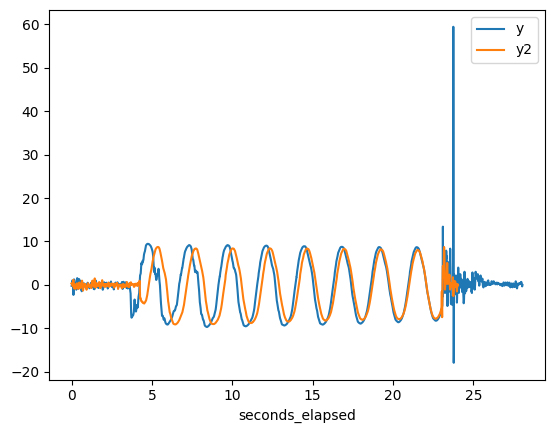

In [12]:
_, ax = plt.subplots()
(accel
 .set_index('seconds_elapsed')
 [['y']]
 .plot(ax=ax)
)
(accel2
 .set_index('seconds_elapsed')
 [['y2']]
 .plot(ax=ax)
)
plt.show()

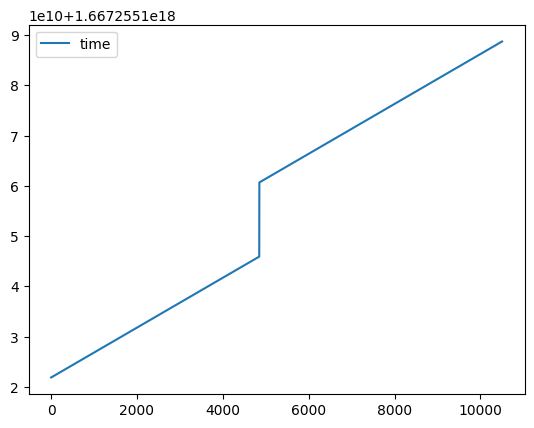

In [46]:
df = pd.DataFrame(
    pd.concat([accel.time, accel2.time])
    .sort_values()
    .reset_index(drop=True)
).plot()

C:\Users\Corey\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


24.8 ms ± 175 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


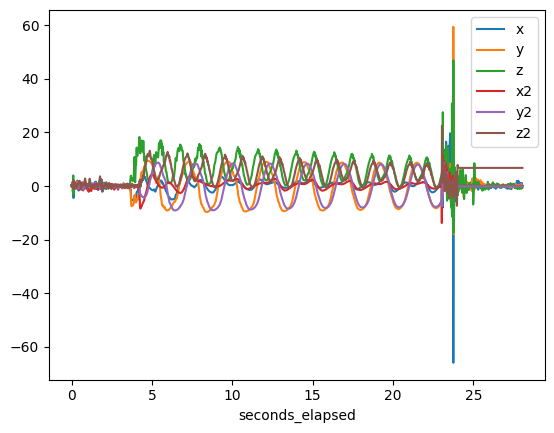

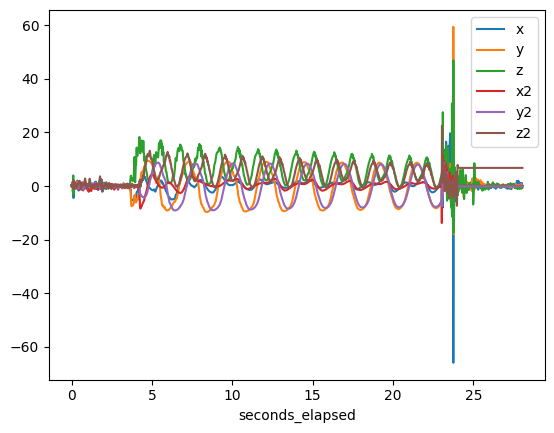

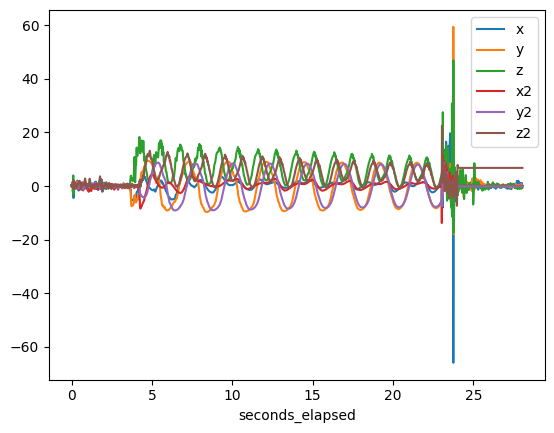

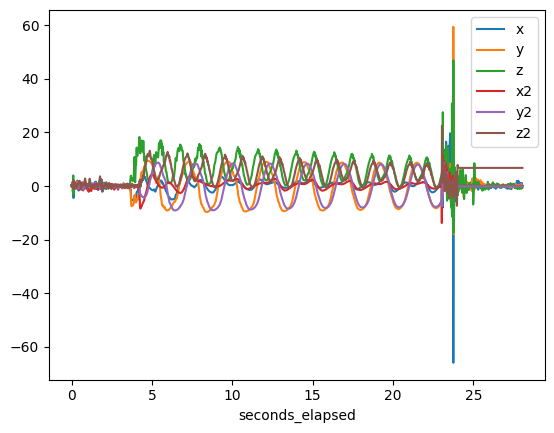

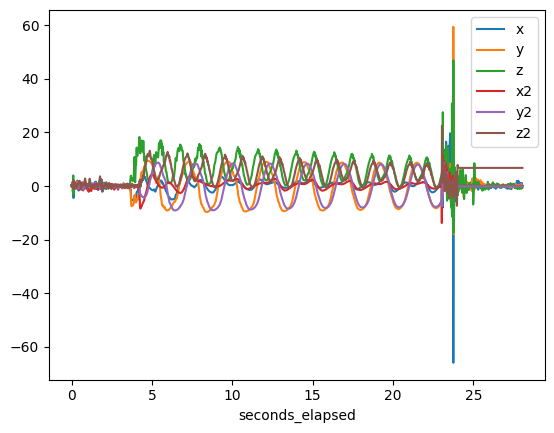

...

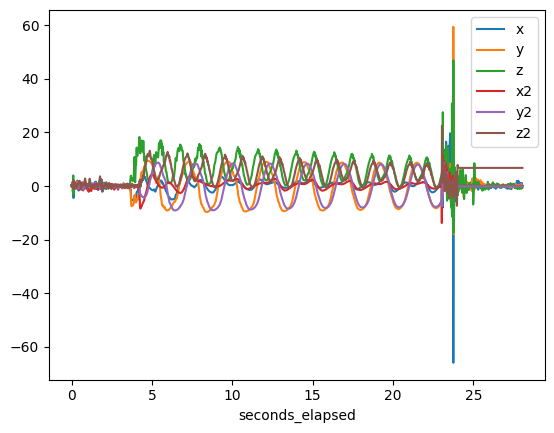

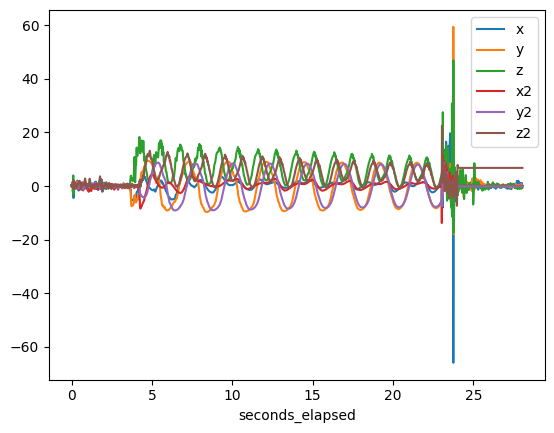

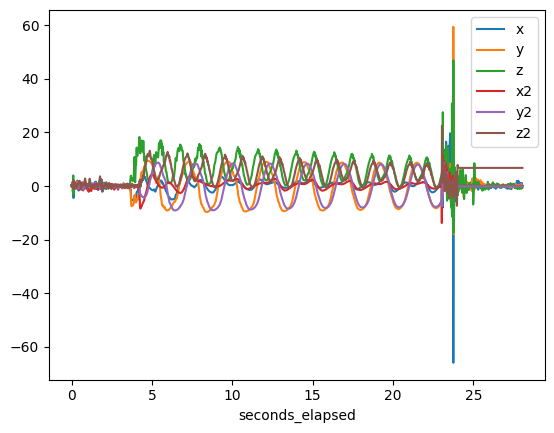

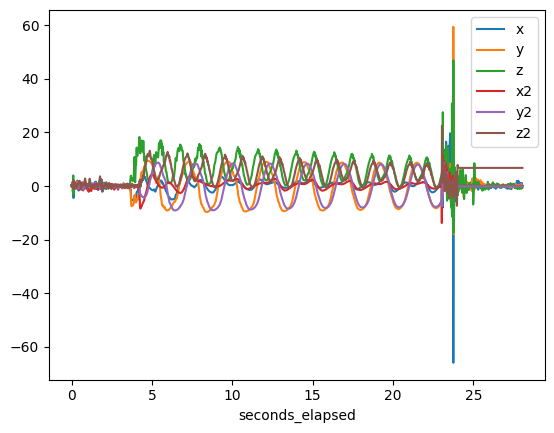

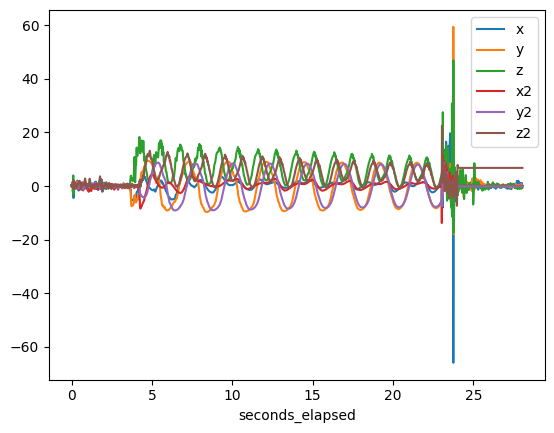

In [77]:
%%timeit
df2 = (
    accel
    .merge(accel2, how='outer')        # left_on, right_on, and could specify what side data is from by indicator
    .sort_values(by='seconds_elapsed')
    .interpolate()
    .set_index('seconds_elapsed')
    [['x', 'y', 'z',
      'x2', 'y2', 'z2']]
    # .seconds_elapsed
    .plot()#marker='+')
)

# concat is faster for this small dataset. is it better for big datasets? not like i'm really gaining anything by using merge

C:\Users\Corey\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


21.2 ms ± 334 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


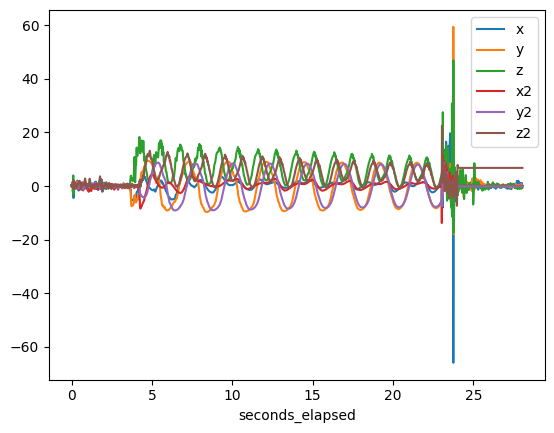

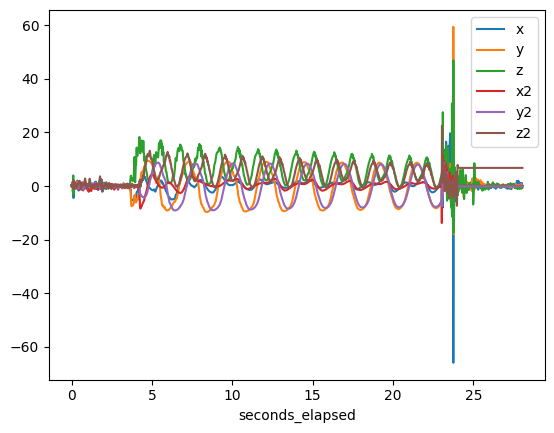

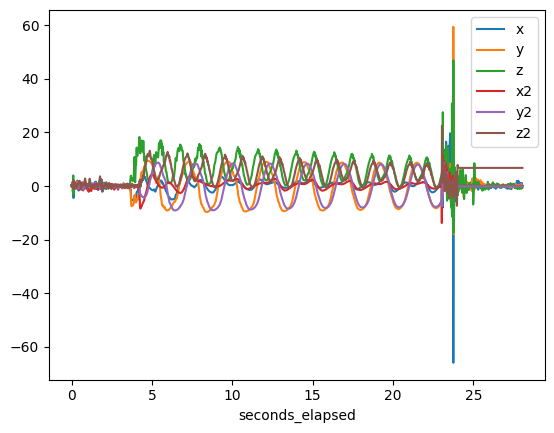

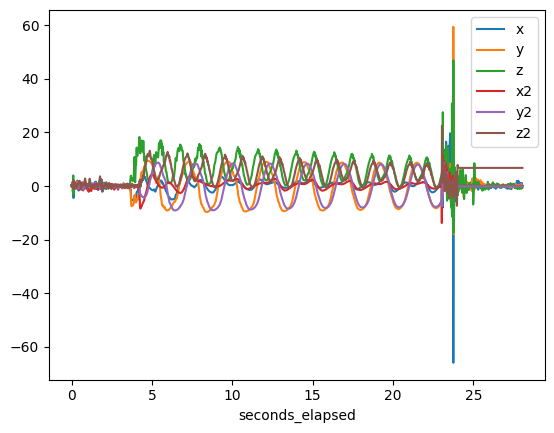

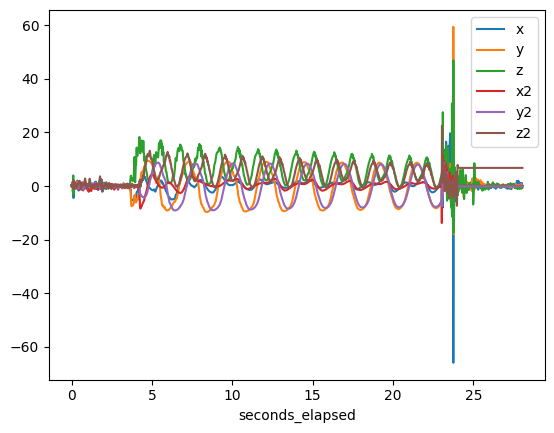

...

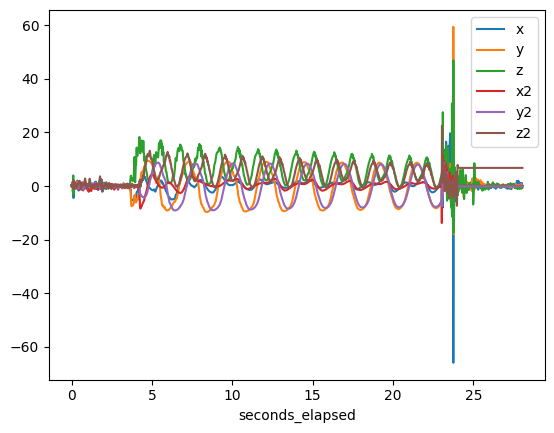

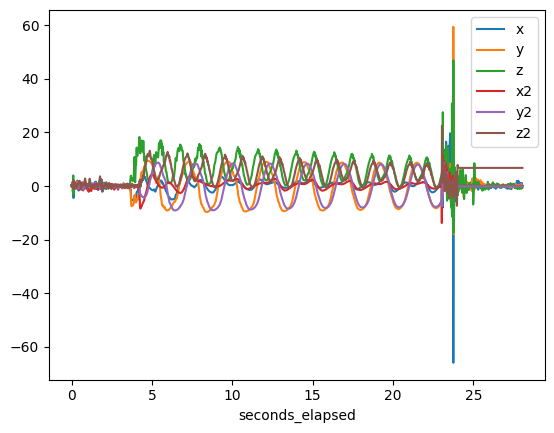

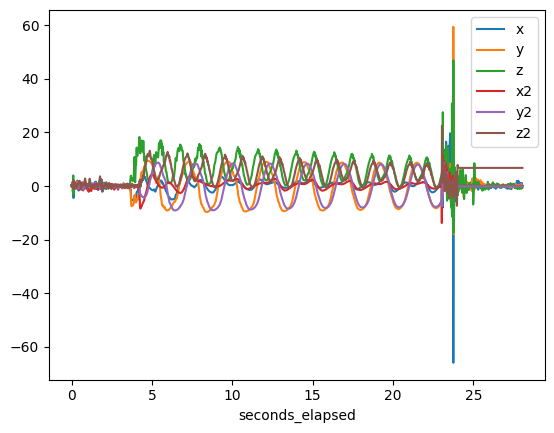

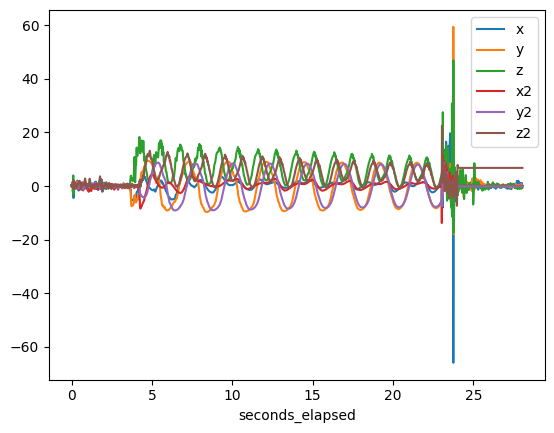

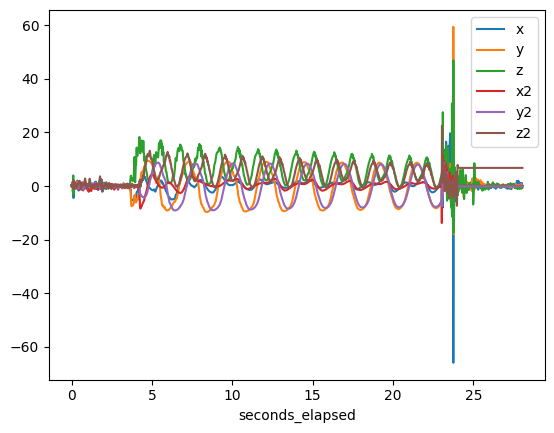

In [78]:
%%timeit
df2 = (
    pd.concat([accel, accel2]) # ignore_index=True
    .sort_values(by='seconds_elapsed')
    .interpolate()
    .set_index('seconds_elapsed')
    [['x', 'y', 'z',
      'x2', 'y2', 'z2']]
    # .seconds_elapsed
    .plot()#marker='+')
)

In [69]:
accel2.time.div(10**9)

0       1.667255e+09
1       1.667255e+09
2       1.667255e+09
3       1.667255e+09
4       1.667255e+09
            ...     
4844    1.667255e+09
4845    1.667255e+09
4846    1.667255e+09
4847    1.667255e+09
4848    1.667255e+09
Name: time, Length: 4849, dtype: float64